<a href="https://colab.research.google.com/github/rameshavinash94/CMPE255_Dimensionality_Reduction/blob/main/Dimensionality_Reduction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **DIMENSIONALITY REDUCTION TECHNIQUES ON TABULAR & IMAGE DATA**

In [ ]:
#LOADING NECESSARY LIBRARIES
import pandas as pd
import numpy as nm
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
from sklearn.manifold import Isomap
from umap import UMAP
from sklearn.manifold import LocallyLinearEmbedding

## **WORKING ON TABULAR DATA**

### **IMPORTING THE DATA ( ANSUR 2 DATASET )**

***A public dataset drawn from the 2012 U.S. Army Anthropometric Survey***

In [ ]:
#load the male dataset
df_male=pd.read_csv('/content/ANSUR II MALE Public.csv',encoding = 'unicode_escape')
df_male.isnull().sum()

subjectid                         0
abdominalextensiondepthsitting    0
acromialheight                    0
acromionradialelength             0
anklecircumference                0
                                 ..
DODRace                           0
Age                               0
Heightin                          0
Weightlbs                         0
WritingPreference                 0
Length: 108, dtype: int64

In [ ]:
#load the female dataset
df_female=pd.read_csv('/content/ANSUR II FEMALE Public.csv',encoding = 'unicode_escape')
df_female.rename(columns={"SubjectId": "subjectid"},inplace=True)

In [ ]:
#concat both datasets
frames=[df_male,df_female]
Final_df= pd.concat(frames)

In [ ]:
Final_df.shape

(6068, 108)

In [ ]:
#non-numeric features in dataset
Non_numeric = ['Gender','Date','Installation','Component','Branch','PrimaryMOS','SubjectsBirthLocation','Ethnicity','WritingPreference']
Non_numeric

['Gender',
 'Date',
 'Installation',
 'Component',
 'Branch',
 'PrimaryMOS',
 'SubjectsBirthLocation',
 'Ethnicity',
 'WritingPreference']

In [ ]:
#drop non-numeric
df_numeric = Final_df.drop(Non_numeric, axis=1)

In [ ]:
#Use Standard Scaler to Normalize the data
scaler = StandardScaler()
fit_transform_data = scaler.fit_transform(df_numeric)

### **PCA**

In [ ]:
# Create a 2/3 component PCA
pca_2d = PCA(n_components=2)
pca_3d = PCA(n_components=3)

# Fit and transform the model on the numeric dataset
pca_2d_features = pca_2d.fit_transform(fit_transform_data)
pca_3d_features = pca_3d.fit_transform(fit_transform_data)

In [ ]:
# Calculate the variance explained by priciple components=2 after scaling
explained_variance = pca_2d.explained_variance_ratio_
print('Variance of each component in 2 components:', pca_2d.explained_variance_ratio_)
print('Total Variance Explained:', round(sum(list(pca_2d.explained_variance_ratio_))*100, 2))

print("\n")
# Calculate the variance explained by priciple components=3 after scaling
explained_variance = pca_3d.explained_variance_ratio_
print('Variance of each component in 3 components:', pca_3d.explained_variance_ratio_)
print('Total Variance Explained:', round(sum(list(pca_3d.explained_variance_ratio_))*100, 2))

Variance of each component in 2 components: [0.54177804 0.12092845]
Total Variance Explained: 66.27


Variance of each component in 3 components: [0.54177804 0.12092845 0.04849885]
Total Variance Explained: 71.12


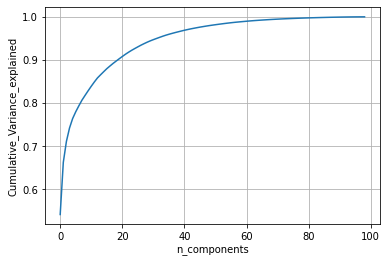

In [ ]:
#plotting pca with variance of different components
pca=PCA()  
pca.n_components=99  
pca_data=pca.fit_transform(fit_transform_data)
percentage_var_explained = pca.explained_variance_ratio_ 
cum_var_explained=np.cumsum(percentage_var_explained)

fig, ax = plt.subplots()

ax.plot(cum_var_explained)
ax.axis('tight')
ax.set_xlabel('n_components') 
ax.set_ylabel('Cumulative_Variance_explained')   
ax.grid()
plt.show()

In [ ]:
#PCA 2d dataframe
PCA_2D=Final_df
PCA_2D['pca_x'] = pca_2d_features[:,0]
PCA_2D['pca_y'] = pca_2d_features[:,1]

In [ ]:
#PCA 3d dataframe
PCA_3D=Final_df
PCA_3D['pca_x'] = pca_3d_features[:,0]
PCA_3D['pca_y'] = pca_3d_features[:,1]
PCA_3D['pca_z'] = pca_3d_features[:,2]

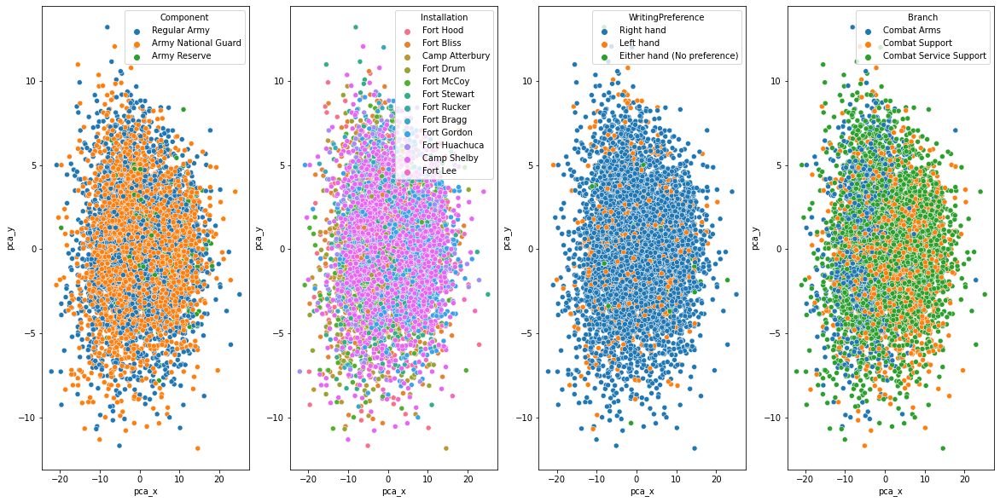

In [ ]:
#2D plot
fig, ax = plt.subplots(1,4)

fig.set_size_inches(20,10)

sns.scatterplot(x=PCA_2D['pca_x'], y=PCA_2D['pca_y'], data=PCA_2D, hue='Component',ax=ax[0])
sns.scatterplot(x=PCA_2D['pca_x'], y=PCA_2D['pca_y'], data=PCA_2D, hue='Installation',ax=ax[1])
sns.scatterplot(x=PCA_2D['pca_x'], y=PCA_2D['pca_y'], data=PCA_2D, hue='WritingPreference',ax=ax[2])
sns.scatterplot(x=PCA_2D['pca_x'], y=PCA_2D['pca_y'], data=PCA_2D, hue='Branch',ax=ax[3])

plt.show()

In [ ]:
#3D plot
fig1 = px.scatter_3d(PCA_3D,x=PCA_3D['pca_x'], y=PCA_3D['pca_y'], z=PCA_3D['pca_z'],color=PCA_3D.Installation, labels={'color': 'Installation'})
fig2 = px.scatter_3d(PCA_3D,x=PCA_3D['pca_x'], y=PCA_3D['pca_y'], z=PCA_3D['pca_z'],color=PCA_3D.Branch, labels={'color': 'Branch'})
fig3 = px.scatter_3d(PCA_3D,x=PCA_3D['pca_x'], y=PCA_3D['pca_y'], z=PCA_3D['pca_z'],color=PCA_3D.Gender, labels={'color': 'Gender'})

fig1.show()
fig2.show()
fig3.show()

### **SVD**

In [ ]:
# Create a 2/3 component SVD
SVD_2d = TruncatedSVD(n_components=2)
SVD_3d = TruncatedSVD(n_components=3)

# Fit and transform the model on the numeric scaled dataset
SVD_2d_features = SVD_2d.fit_transform(fit_transform_data)
SVD_3d_features = SVD_3d.fit_transform(fit_transform_data)

In [ ]:
# Calculate the variance explained by components=2
print('Variance of each component in 2 components:', SVD_2d.explained_variance_ratio_)
print('Total Variance Explained:', round(sum(list(SVD_2d.explained_variance_ratio_))*100, 2))

print("\n")
# Calculate the variance explained by components=3
print('Variance of each component in 3 components:', SVD_3d.explained_variance_ratio_)
print('Total Variance Explained:', round(sum(list(SVD_3d.explained_variance_ratio_))*100, 2))

Variance of each component in 2 components: [0.54177804 0.12092845]
Total Variance Explained: 66.27


Variance of each component in 3 components: [0.54177804 0.12092845 0.04849885]
Total Variance Explained: 71.12


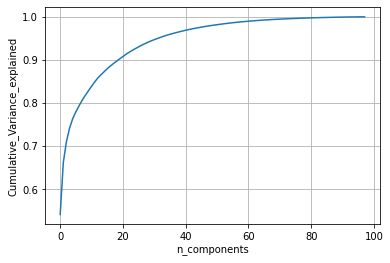

In [ ]:
#plotting SVD with variance of different components
svd=TruncatedSVD()  
svd.n_components=98  
svd_data=svd.fit_transform(fit_transform_data)
percentage_var_explained = svd.explained_variance_ratio_
cum_var_explained=np.cumsum(percentage_var_explained)

fig, ax = plt.subplots()

ax.plot(cum_var_explained)
ax.axis('tight')
ax.set_xlabel('n_components') 
ax.set_ylabel('Cumulative_Variance_explained')   
ax.grid()
plt.show()

In [ ]:
#SVD 2d dataframe
SVD_2D=Final_df
SVD_2D['svd_x'] = SVD_2d_features[:,0]
SVD_2D['svd_y'] = SVD_2d_features[:,1]

In [ ]:
#SVD 3d dataframe
SVD_3D=Final_df
SVD_3D['svd_x'] = SVD_3d_features[:,0]
SVD_3D['svd_y'] = SVD_3d_features[:,1]
SVD_3D['svd_z'] = SVD_3d_features[:,2]

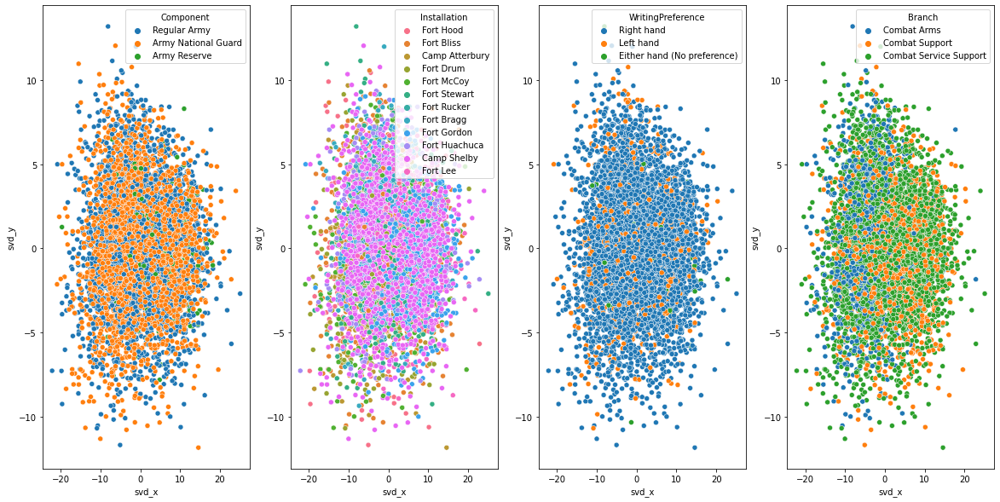

In [ ]:
#2D plot
fig, ax = plt.subplots(1,4)
fig.set_size_inches(20,10)

sns.scatterplot(x=SVD_2D['svd_x'], y=SVD_2D['svd_y'], data=SVD_2D, hue='Component',ax=ax[0])
sns.scatterplot(x=SVD_2D['svd_x'], y=SVD_2D['svd_y'], data=SVD_2D, hue='Installation',ax=ax[1])
sns.scatterplot(x=SVD_2D['svd_x'], y=SVD_2D['svd_y'], data=SVD_2D, hue='WritingPreference',ax=ax[2])
sns.scatterplot(x=SVD_2D['svd_x'], y=SVD_2D['svd_y'], data=SVD_2D, hue='Branch',ax=ax[3])

plt.show()

In [ ]:
#3D plot
fig1 = px.scatter_3d(SVD_3D,x=SVD_3D['svd_x'], y=SVD_3D['svd_y'], z=SVD_3D['svd_z'],color=SVD_3D.Installation, labels={'color': 'Installation'})
fig2 = px.scatter_3d(SVD_3D,x=SVD_3D['svd_x'], y=SVD_3D['svd_y'], z=SVD_3D['svd_z'],color=SVD_3D.Branch, labels={'color': 'Branch'})
fig3 = px.scatter_3d(SVD_3D,x=SVD_3D['svd_x'], y=SVD_3D['svd_y'], z=SVD_3D['svd_z'],color=SVD_3D.Gender, labels={'color': 'Gender'})

fig1.show()
fig2.show()
fig3.show()

### **TSNE**

In [ ]:
#reducing dimensionality by PCA prior T-SE (n=20 provides more than 90 Cumulative_Variance_explained in data)
#It takes a lots of time to run compared to other reduction techniques
pca = PCA(n_components=20)
x_pca = pca.fit_transform(fit_transform_data)
x_pca = pd.DataFrame(x_pca)

# Create a 2/3 component t-SNE model with learning rate 50
tsne_2d = TSNE(learning_rate=50,n_components=2)
tsne_3d = TSNE(learning_rate=50,n_components=3)

# Fit and transform the t-SNE model on the numeric dataset
tsne_2d_features = tsne_2d.fit_transform(x_pca)
tsne_3d_features = tsne_3d.fit_transform(x_pca)

In [ ]:
#t-sne 2d dataframe
TSNE_2D=Final_df
TSNE_2D['tse_x'] = tsne_2d_features[:,0]
TSNE_2D['tse_y'] = tsne_3d_features[:,1]

In [ ]:
#t-sne 3d dataframe
TSNE_3D=Final_df
TSNE_3D['tse_x'] = tsne_3d_features[:,0]
TSNE_3D['tse_y'] = tsne_3d_features[:,1]
TSNE_3D['tse_z'] = tsne_3d_features[:,2]

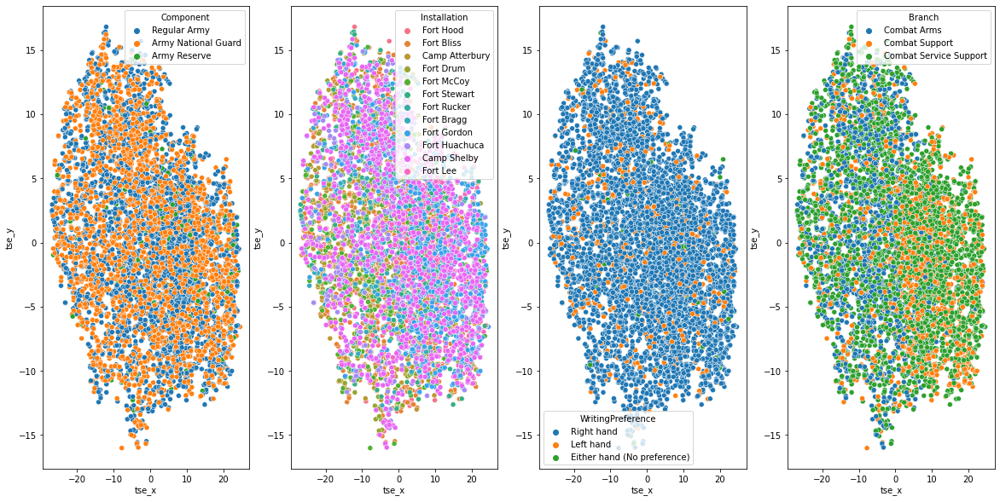

In [ ]:
# 2D plot
fig, ax = plt.subplots(1,4)
fig.set_size_inches(20,10)

sns.scatterplot(x=TSNE_2D['tse_x'], y=TSNE_2D['tse_y'], data=TSNE_2D, hue='Component',ax=ax[0])
sns.scatterplot(x=TSNE_2D['tse_x'], y=TSNE_2D['tse_y'], data=TSNE_2D, hue='Installation',ax=ax[1])
sns.scatterplot(x=TSNE_2D['tse_x'], y=TSNE_2D['tse_y'], data=TSNE_2D, hue='WritingPreference',ax=ax[2])
sns.scatterplot(x=TSNE_2D['tse_x'], y=TSNE_2D['tse_y'], data=TSNE_2D, hue='Branch',ax=ax[3])

plt.show()

In [ ]:
#3D plot
fig1 = px.scatter_3d(TSNE_3D,x=TSNE_3D['tse_x'], y=TSNE_3D['tse_y'], z=TSNE_3D['tse_z'],color=TSNE_3D.Installation, labels={'color': 'Installation'})
fig2 = px.scatter_3d(TSNE_3D,x=TSNE_3D['tse_x'], y=TSNE_3D['tse_y'], z=TSNE_3D['tse_z'],color=TSNE_3D.Branch, labels={'color': 'Branch'})
fig3 = px.scatter_3d(TSNE_3D,x=TSNE_3D['tse_x'], y=TSNE_3D['tse_y'], z=TSNE_3D['tse_z'],color=TSNE_3D.Gender, labels={'color': 'Gender'})

fig1.show()
fig2.show()
fig3.show()

### **ISOMAP**

In [ ]:
iso_2d = Isomap(n_neighbors = 10,n_components = 2)
iso_3d = Isomap(n_neighbors = 10,n_components = 3)

# Fit and transform the isomap model on the numeric dataset
Isomap_2dfeatures = iso_2d.fit_transform(fit_transform_data)
Isomap_3dfeatures = iso_3d.fit_transform(fit_transform_data)

In [ ]:
#isomap 2d dataframe
ISO_2D=Final_df
ISO_2D['iso_x'] = Isomap_2dfeatures[:,0]
ISO_2D['iso_y'] = Isomap_2dfeatures[:,1]

In [ ]:
#isomap 3d dataframe
ISO_3D=Final_df
ISO_3D['iso_x'] = Isomap_3dfeatures[:,0]
ISO_3D['iso_y'] = Isomap_3dfeatures[:,1]
ISO_3D['iso_z'] = Isomap_3dfeatures[:,2]

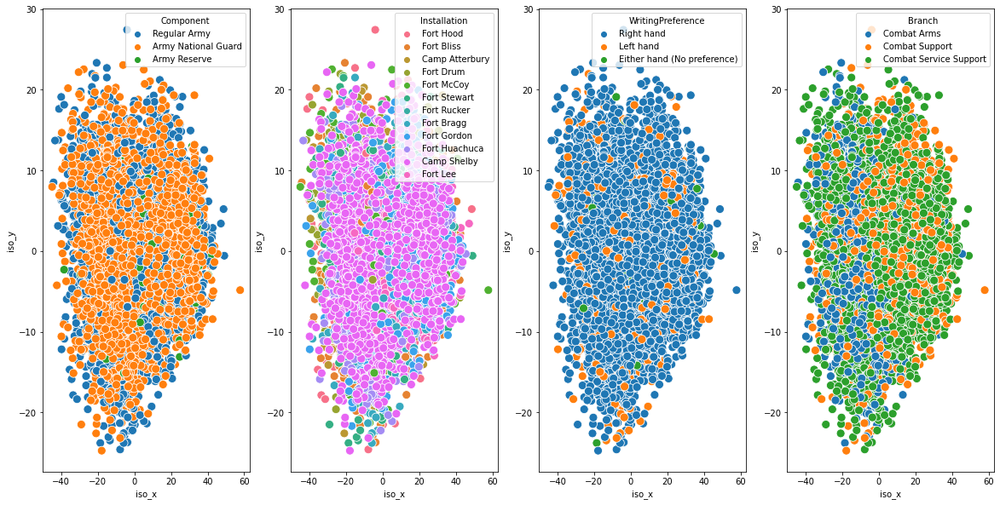

In [ ]:
#2D plot
fig, ax = plt.subplots(1,4)
fig.set_size_inches(20,10)

sns.scatterplot(x=ISO_2D['iso_x'], y=ISO_2D['iso_y'], data=ISO_2D, hue='Component',ax=ax[0],s=100)
sns.scatterplot(x=ISO_2D['iso_x'], y=ISO_2D['iso_y'], data=ISO_2D, hue='Installation',ax=ax[1],s=100)
sns.scatterplot(x=ISO_2D['iso_x'], y=ISO_2D['iso_y'], data=ISO_2D, hue='WritingPreference',ax=ax[2],s=100)
sns.scatterplot(x=ISO_2D['iso_x'], y=ISO_2D['iso_y'], data=ISO_2D, hue='Branch',ax=ax[3],s=100)

plt.show()

In [ ]:
#3D plot
fig1 = px.scatter_3d(ISO_3D,x=ISO_3D['iso_x'], y=ISO_3D['iso_y'], z=ISO_3D['iso_z'],color=ISO_3D.Installation, labels={'color': 'Installation'})
fig2 = px.scatter_3d(ISO_3D,x=ISO_3D['iso_x'], y=ISO_3D['iso_y'], z=ISO_3D['iso_z'],color=ISO_3D.Branch, labels={'color': 'Branch'})
fig3 = px.scatter_3d(ISO_3D,x=ISO_3D['iso_x'], y=ISO_3D['iso_y'], z=ISO_3D['iso_z'],color=ISO_3D.Gender, labels={'color': 'Gender'})

fig1.show()
fig2.show()
fig3.show() 

### **UMAP**

In [ ]:
umap_2d = UMAP(n_components=2, init='random', random_state=0)
umap_3d = UMAP(n_components=3, init='random', random_state=0)

# Fit and transform the umap model on the numeric dataset
umap_2dfeatures = umap_2d.fit_transform(fit_transform_data)
umap_3dfeatures = umap_3d.fit_transform(fit_transform_data)

In [ ]:
#UMAP 2d dataframe
UMAP_2D=Final_df
UMAP_2D['umap_x'] = umap_2dfeatures[:,0]
UMAP_2D['umap_y'] = umap_2dfeatures[:,1]

In [ ]:
#UMAP 3d dataframe
UMAP_3D=Final_df
UMAP_3D['umap_x'] = umap_3dfeatures[:,0]
UMAP_3D['umap_y'] = umap_3dfeatures[:,1]
UMAP_3D['umap_z'] = umap_3dfeatures[:,2]

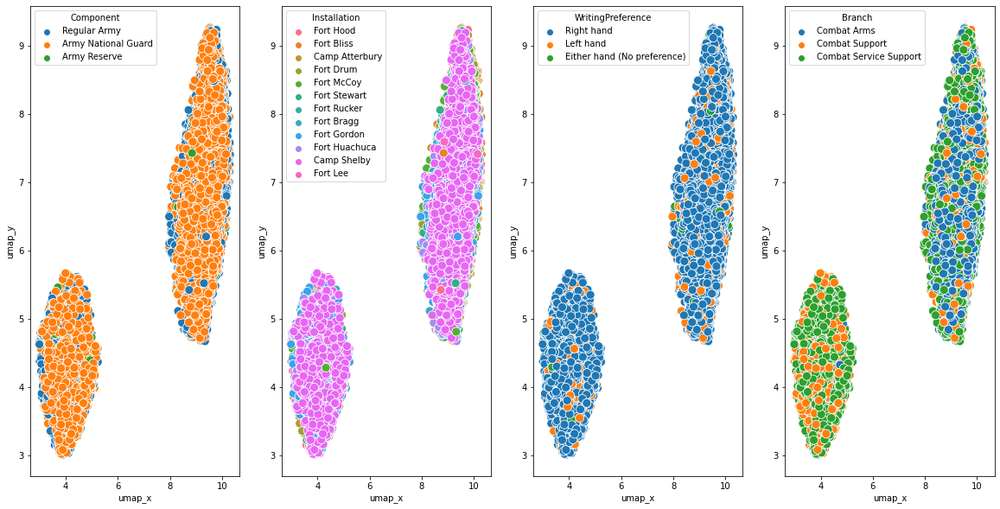

In [ ]:
#2D plot
fig, ax = plt.subplots(1,4)
fig.set_size_inches(20,10)

sns.scatterplot(x=UMAP_2D['umap_x'], y=UMAP_2D['umap_y'], data=UMAP_2D, hue='Component',ax=ax[0],s=100)
sns.scatterplot(x=UMAP_2D['umap_x'], y=UMAP_2D['umap_y'], data=UMAP_2D, hue='Installation',ax=ax[1],s=100)
sns.scatterplot(x=UMAP_2D['umap_x'], y=UMAP_2D['umap_y'], data=UMAP_2D, hue='WritingPreference',ax=ax[2],s=100)
sns.scatterplot(x=UMAP_2D['umap_x'], y=UMAP_2D['umap_y'], data=UMAP_2D, hue='Branch',ax=ax[3],s=100)

plt.show()

In [ ]:
#3D plot
fig1 = px.scatter_3d(UMAP_3D,x=UMAP_3D['umap_x'], y=UMAP_3D['umap_y'], z=UMAP_3D['umap_z'],color=UMAP_3D.Installation, labels={'color': 'Installation'})
fig2 = px.scatter_3d(UMAP_3D,x=UMAP_3D['umap_x'], y=UMAP_3D['umap_y'], z=UMAP_3D['umap_z'],color=UMAP_3D.Branch, labels={'color': 'Branch'})
fig3 = px.scatter_3d(UMAP_3D,x=UMAP_3D['umap_x'], y=UMAP_3D['umap_y'], z=UMAP_3D['umap_z'],color=UMAP_3D.Gender, labels={'color': 'Gender'})

fig1.show()
fig2.show()
fig3.show()

### **LLE**

In [ ]:
LLE_2d = LocallyLinearEmbedding(n_components=2, n_neighbors=10)
LLE_3d = LocallyLinearEmbedding(n_components=3, n_neighbors=10)

# Fit and transform the LLE model on the numeric dataset
LLE_2dfeatures = LLE_2d.fit_transform(fit_transform_data)
LLE_3dfeatures = LLE_3d.fit_transform(fit_transform_data)

In [ ]:
#LLE 2d dataframe
LLE_2D=Final_df
LLE_2D['lle_x'] = LLE_2dfeatures[:,0]
LLE_2D['lle_y'] = LLE_2dfeatures[:,1]

In [ ]:
#LLE 3d dataframe
LLE_3D=Final_df
LLE_3D['lle_x'] = LLE_3dfeatures[:,0]
LLE_3D['lle_y'] = LLE_3dfeatures[:,1]
LLE_3D['lle_z'] = LLE_3dfeatures[:,2]

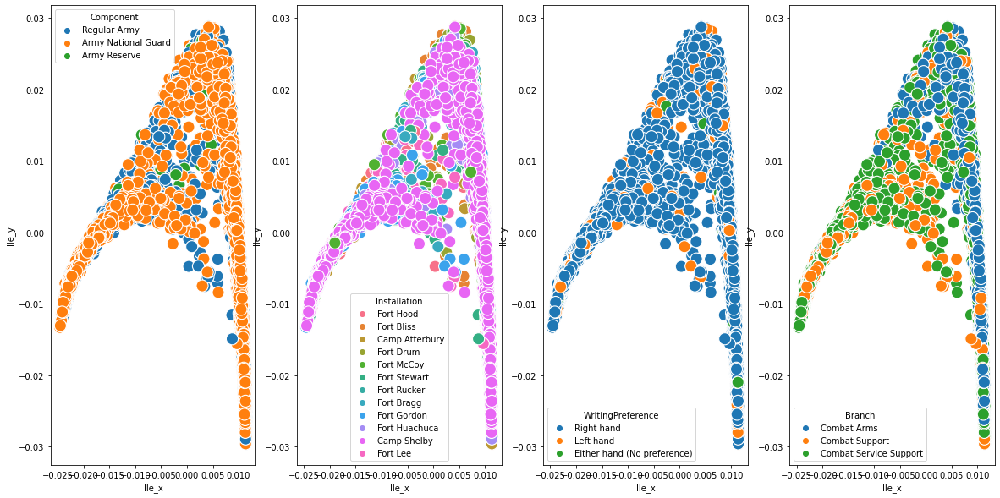

In [ ]:
#2D plot
fig, ax = plt.subplots(1,4)
fig.set_size_inches(20,10)

sns.scatterplot(x=UMAP_2D['lle_x'], y=UMAP_2D['lle_y'], data=UMAP_2D, hue='Component',ax=ax[0],s=200)
sns.scatterplot(x=UMAP_2D['lle_x'], y=UMAP_2D['lle_y'], data=UMAP_2D, hue='Installation',ax=ax[1],s=200)
sns.scatterplot(x=UMAP_2D['lle_x'], y=UMAP_2D['lle_y'], data=UMAP_2D, hue='WritingPreference',ax=ax[2],s=200)
sns.scatterplot(x=UMAP_2D['lle_x'], y=UMAP_2D['lle_y'], data=UMAP_2D, hue='Branch',ax=ax[3],s=200)

plt.show()

In [ ]:
#3D plot
fig1 = px.scatter_3d(LLE_3D,x=LLE_3D['umap_x'], y=LLE_3D['umap_y'], z=LLE_3D['umap_z'],color=LLE_3D.Installation, labels={'color': 'Installation'})
fig2 = px.scatter_3d(LLE_3D,x=LLE_3D['umap_x'], y=LLE_3D['umap_y'], z=LLE_3D['umap_z'],color=LLE_3D.Branch, labels={'color': 'Branch'})
fig3 = px.scatter_3d(LLE_3D,x=LLE_3D['umap_x'], y=LLE_3D['umap_y'], z=LLE_3D['umap_z'],color=LLE_3D.Gender, labels={'color': 'Gender'})

fig1.show()
fig2.show()
fig3.show()

## **WORKING ON IMAGE DATASET**

#### **LOADING AND PLOTTING THE IMAGE FASHION DATA**

In [ ]:
#read fashion image data and taking only 1000 samples
fashion_train = pd.read_csv("/content/fashion-mnist_train.csv")
data = fashion_train.iloc[0:1000, 1:].values.astype(np.float32)
target = fashion_train['label'].values[:1000]

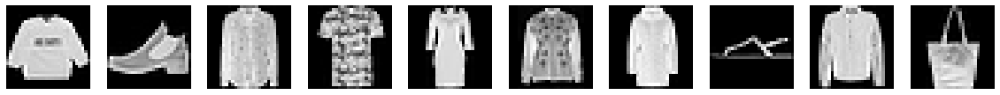

In [ ]:
#plot 10 images from the dataset
fig, ax = plt.subplots(1,10)
fig.set_size_inches(20,20)
for x in range(10):
  test_data = fashion_train.iloc[x, 1:].to_numpy().reshape(28,28)
  ax[x].imshow(test_data,cmap='gray')
  ax[x].axis('off')

plt.show()

In [ ]:
#Target Label Mapping
labels = { 0: 'T-shirt/top', 1: 'Trouser', 2: 'Pullover', 3: 'Dress', 4: 'Coat', 
          5: 'Sandal', 6: 'Shirt', 7: 'Sneaker', 8 : 'Bag', 9 : 'Ankle boot'}

### **PCA**

In [ ]:
# Create a 2/3 component pca model
pca_2d = PCA(n_components=2)
pca_3d = PCA(n_components=3)

# Fit and transform the pca model on the image dataset
pca_2d_features = pca_2d.fit_transform(data)
pca_3d_features = pca_3d.fit_transform(data)

In [ ]:
# Calculate the variance explained by priciple components=2
explained_variance = pca_2d.explained_variance_ratio_
print('Variance of each component in 2 components:', pca_2d.explained_variance_ratio_)
print('Total Variance Explained:', round(sum(list(pca_2d.explained_variance_ratio_))*100, 2))

print("\n")
# Calculate the variance explained by priciple components=3
explained_variance = pca_3d.explained_variance_ratio_
print('Variance of each component in 3 components:', pca_3d.explained_variance_ratio_)
print('Total Variance Explained:', round(sum(list(pca_3d.explained_variance_ratio_))*100, 2))

Variance of each component in 2 components: [0.28495473 0.17530389]
Total Variance Explained: 46.03


Variance of each component in 3 components: [0.2849548  0.175304   0.06379472]
Total Variance Explained: 52.41


In [ ]:
#PCA 2d/3d dataframes

pcaa_2d = pd.DataFrame(pca_2d_features, columns=('x', 'y'))
pcaa_2d["Category"] = target

pcaa_3d = pd.DataFrame(pca_3d_features, columns=('x', 'y','z'))
pcaa_3d["Category"] = target

In [ ]:
#rename target category labels
pcaa_2d["Category"].replace(labels, inplace=True)
pcaa_3d["Category"].replace(labels, inplace=True)

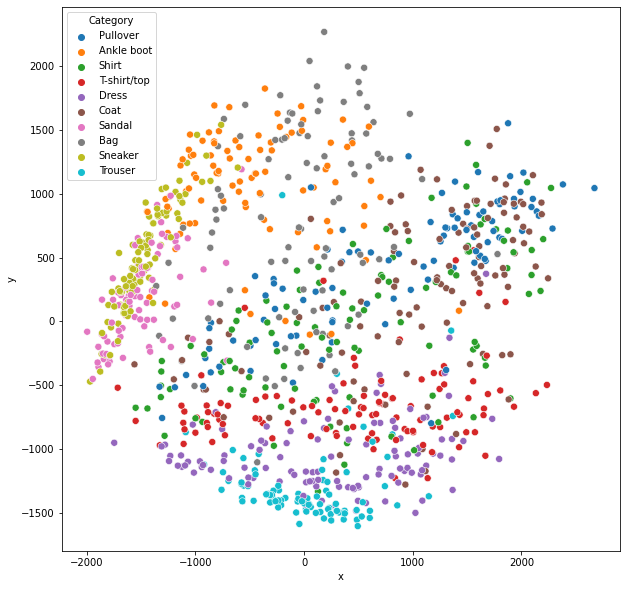

In [ ]:
#2D plot
fig, ax = plt.subplots()
fig.set_size_inches(10,10)

sns.scatterplot(x = pcaa_2d["x"], y = pcaa_2d["y"], data = pcaa_2d, hue = "Category", s=50,ax=ax)
plt.show()

In [ ]:
#3D plot
fig1 = px.scatter_3d(pcaa_3d,x=pcaa_3d['x'], y=pcaa_3d['y'], z=pcaa_3d['z'],color=pcaa_3d.Category, labels={'color': 'Category'})
fig1.show()

### **SVD**

In [ ]:
# Create a 2/3 component SVD model
SVD_2d = TruncatedSVD(n_components=2)
SVD_3d = TruncatedSVD(n_components=3)

# Fit and transform the SVD model on the image dataset
SVD_2d_features = SVD_2d.fit_transform(data)
SVD_3d_features = SVD_3d.fit_transform(data)

In [ ]:
# Calculate the variance explained by  components=2
print('Variance of each component in 2 components:', SVD_2d.explained_variance_ratio_)
print('Total Variance Explained:', round(sum(list(SVD_2d.explained_variance_ratio_))*100, 2))

print("\n")
# Calculate the variance explained by  components=3
print('Variance of each component in 3 components:', SVD_3d.explained_variance_ratio_)
print('Total Variance Explained:', round(sum(list(SVD_3d.explained_variance_ratio_))*100, 2))

Variance of each component in 2 components: [0.24670005 0.18865137]
Total Variance Explained: 43.54


Variance of each component in 3 components: [0.24670029 0.18865137 0.0847856 ]
Total Variance Explained: 52.01


In [ ]:
#SVD 2d/3d dataframes
svd_2d = pd.DataFrame(pca_2d_features, columns=('x', 'y'))
svd_2d["Category"] = target

svd_3d = pd.DataFrame(pca_3d_features, columns=('x', 'y','z'))
svd_3d["Category"] = target

In [ ]:
#rename target category labels
svd_2d["Category"].replace(labels, inplace=True)
svd_3d["Category"].replace(labels, inplace=True)

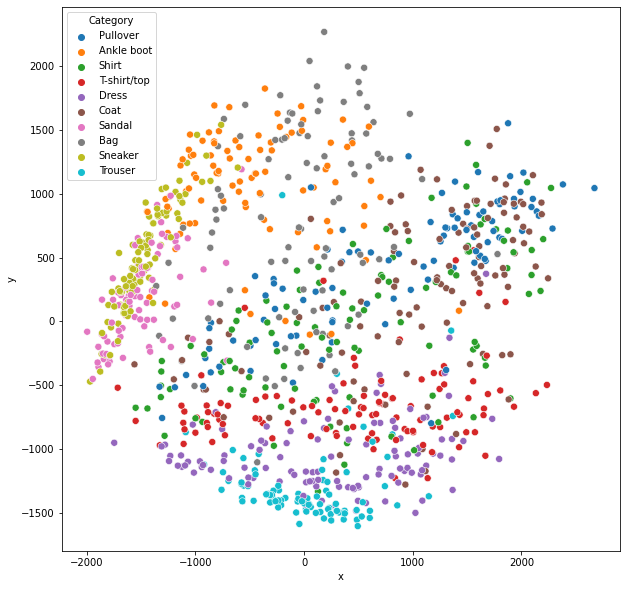

In [ ]:
#2D plot
fig, ax = plt.subplots()
fig.set_size_inches(10,10)

sns.scatterplot(x = svd_2d["x"], y = svd_2d["y"], data = svd_2d, hue = "Category", s=50,ax=ax)
plt.show()

In [ ]:
#3D plot

fig1 = px.scatter_3d(svd_3d,x=svd_3d['x'], y=svd_3d['y'], z=svd_3d['z'],color=svd_3d.Category, labels={'color': 'Category'})
fig1.show()

### **TSNE**

In [ ]:
#just picking 250 pca components since we get 98% total explained variance with that prior passing to tsne
pca = PCA(n_components=250)
x_pca = pca.fit_transform(data)
x_pca = pd.DataFrame(x_pca)

explained_variance = pca.explained_variance_ratio_
round(sum(list(pca.explained_variance_ratio_))*100, 2)

98.01

In [ ]:
# Create a 2/3 component t-SNE model with learning rate 50
tsne_2d = TSNE(learning_rate=50,n_components=2)
tsne_3d = TSNE(learning_rate=50,n_components=3)

# Fit and transform the t-SNE model on the image dataset
tsne_2d_features = tsne_2d.fit_transform(x_pca)
tsne_3d_features = tsne_3d.fit_transform(x_pca)

In [ ]:
#tsne 2d/3d dataframes

tsne_2d = pd.DataFrame(tsne_2d_features, columns=('x', 'y'))
tsne_2d["Category"] = target

tsne_3d = pd.DataFrame(tsne_3d_features, columns=('x', 'y','z'))
tsne_3d["Category"] = target

In [ ]:
#rename target category labels

tsne_2d["Category"].replace(labels, inplace=True)
tsne_3d["Category"].replace(labels, inplace=True)

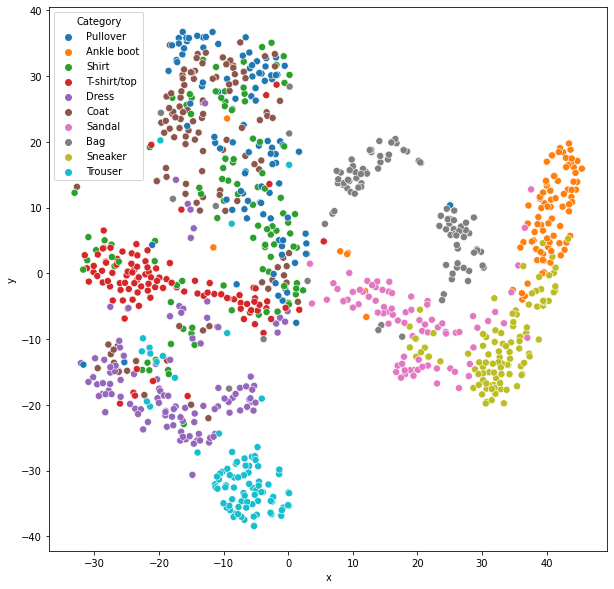

In [ ]:
#2D plot

fig, ax = plt.subplots()
fig.set_size_inches(10,10)

sns.scatterplot(x = tsne_2d["x"], y = tsne_2d["y"], data = tsne_2d, hue = "Category", s=50,ax=ax)
plt.show()

In [ ]:
#3D plot

fig1 = px.scatter_3d(tsne_3d,x=tsne_3d['x'], y=tsne_3d['y'], z=tsne_3d['z'],color=tsne_3d.Category, labels={'color': 'Category'})
fig1.show()

### **UMAP**

In [ ]:
# Create a 2/3 component UMAP model

umap_2d = UMAP(n_components=2, init='random', random_state=0)
umap_3d = UMAP(n_components=3, init='random', random_state=0)

# Fit and transform the UMAP model on the image dataset
umap_2dfeatures = umap_2d.fit_transform(data)
umap_3dfeatures = umap_3d.fit_transform(data)

In [ ]:
#umap 2d/3d dataframes

df_2d = pd.DataFrame(umap_2dfeatures, columns=('x', 'y'))
df_2d["Category"] = target

df_3d = pd.DataFrame(umap_3dfeatures, columns=('x', 'y','z'))
df_3d["Category"] = target

In [ ]:
#rename target category labels

df_2d["Category"].replace(labels, inplace=True)
df_3d["Category"].replace(labels, inplace=True)

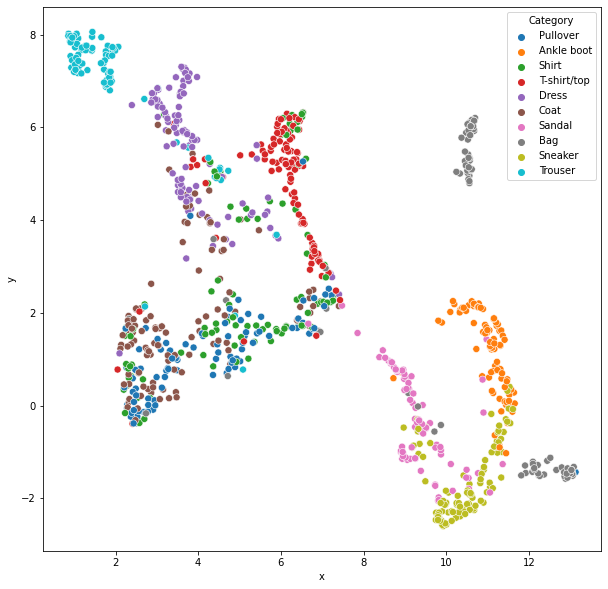

In [ ]:
#2D plot
fig, ax = plt.subplots()
fig.set_size_inches(10,10)

sns.scatterplot(x = df_2d["x"], y = df_2d["y"], data = df_2d, hue = "Category", s=50,ax=ax)
plt.show()

In [ ]:
#3D plot
fig1 = px.scatter_3d(df_3d,x=df_3d['x'], y=df_3d['y'], z=df_3d['z'],color=df_3d.Category, labels={'color': 'Category'})
fig1.show()

### **ISOMAP**

In [ ]:
# Create a 2/3 component ISOMAP model

iso_2d = Isomap(n_neighbors = 10,n_components = 2)
iso_3d = Isomap(n_neighbors = 10,n_components = 3)

# Fit and transform the ISOMAP model on the image dataset
Isomap_2dfeatures = iso_2d.fit_transform(data)
Isomap_3dfeatures = iso_3d.fit_transform(data)

In [ ]:
#isomap 2d/3d dataframes

isodf_2d = pd.DataFrame(umap_2dfeatures, columns=('x', 'y'))
isodf_2d["Category"] = target

isodf_3d = pd.DataFrame(umap_3dfeatures, columns=('x', 'y','z'))
isodf_3d["Category"] = target

In [ ]:
#rename target category labels

isodf_2d["Category"].replace(labels, inplace=True)
isodf_3d["Category"].replace(labels, inplace=True)

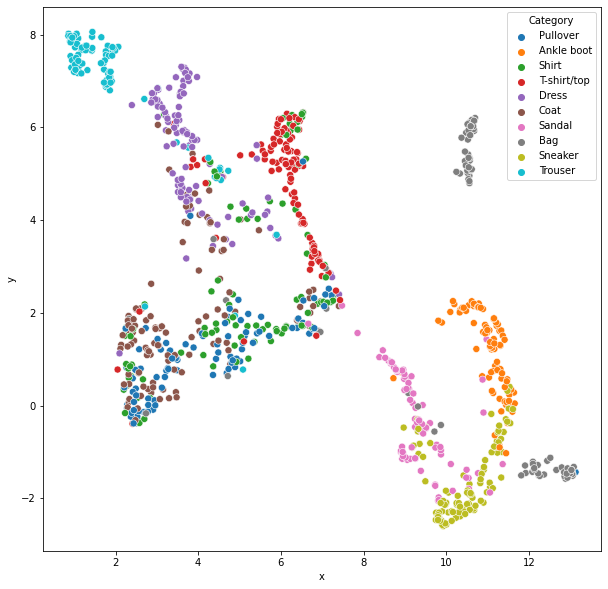

In [ ]:
#2D plot
fig, ax = plt.subplots()
fig.set_size_inches(10,10)

sns.scatterplot(x = isodf_2d["x"], y = isodf_2d["y"], data = isodf_2d, hue = "Category", s=50,ax=ax)
plt.show()

In [ ]:
#3D plot
ig1 = px.scatter_3d(isodf_3d,x=isodf_3d['x'], y=isodf_3d['y'], z=isodf_3d['z'],color=isodf_3d.Category, labels={'color': 'Category'})
fig1.show()

### **LLE**

In [ ]:
# Create a 2/3 component LLE model

LLE_2d = LocallyLinearEmbedding(n_components=2, n_neighbors=10)
LLE_3d = LocallyLinearEmbedding(n_components=3, n_neighbors=10)

# Fit and transform the LLE model on the image dataset
LLE_2dfeatures = LLE_2d.fit_transform(data)
LLE_3dfeatures = LLE_3d.fit_transform(data)

In [ ]:
#lle 2d/3d dataframes

lledf_2d = pd.DataFrame(LLE_2dfeatures, columns=('x', 'y'))
lledf_2d["Category"] = target

lledf_3d = pd.DataFrame(LLE_3dfeatures, columns=('x', 'y','z'))
lledf_3d["Category"] = target

In [ ]:
#rename target category labels

lledf_2d["Category"].replace(labels, inplace=True)
lledf_3d["Category"].replace(labels, inplace=True)

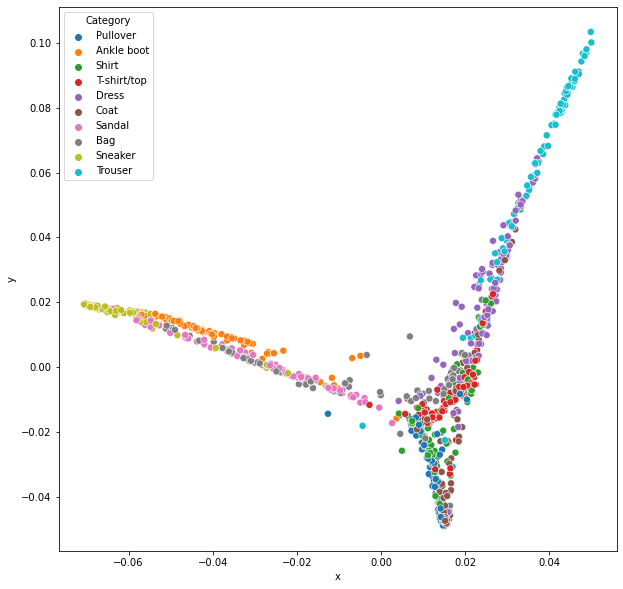

In [ ]:
#2D plot

fig, ax = plt.subplots()
fig.set_size_inches(10,10)

sns.scatterplot(x = lledf_2d["x"], y = lledf_2d["y"], data = lledf_2d, hue = "Category", s=50,ax=ax)
plt.show()

In [ ]:
#3D plot

fig1 = px.scatter_3d(lledf_3d,x=lledf_3d['x'], y=lledf_3d['y'], z=lledf_3d['z'],color=lledf_3d.Category, labels={'color': 'Category'})
fig1.show()